In [1]:
import IPython
import sys
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf
import keras

from music21 import *
from grammar import *
from qa import *
from preprocess import *
from music_utils import *
from data_utils import *
from outputs import *
from test_utils import *

from keras.layers import Dense, Activation, Dropout, Input, LSTM, Reshape, Lambda, RepeatVector
from keras.models import Model
from keras.optimizers import Adam
from keras.utils import to_categorical

I0000 00:00:1789736794.595281  390713 cudart_stub.cc:31] Could not find cuda drivers on your machine, GPU will not be used.
I0000 00:00:1789736794.731004  390713 cpu_feature_guard.cc:227] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
I0000 00:00:1789736798.185958  390713 cudart_stub.cc:31] Could not find cuda drivers on your machine, GPU will not be used.


In [2]:
IPython.display.Audio('./data/30s_seq.mp3')

In [3]:
X, Y, n_values, indices_values, chords = load_music_utils('data/original_metheny.mid')
print("number of tranining examples:", X.shape[0])
print("Tx (length of sequence):", X.shape[1])
print("total # of unique values:", n_values)
print("shape of X:", X.shape)
print("Shape of Y:", Y.shape)
print("Number of chords:", len(chords))

number of tranining examples: 60
Tx (length of sequence): 30
total # of unique values: 90
shape of X: (60, 30, 90)
Shape of Y: (30, 60, 90)
Number of chords: 19


# Building the Model

In [4]:
n_a = 64

In [5]:
n_values = 90
reshaper = Reshape((1, n_values))
LSTM_cell = LSTM(n_a, return_state=True)
densor = Dense(n_values, activation='softmax')

E0000 00:00:1789736811.815792  390713 cuda_executor.cc:1737] INTERNAL: CUDA Runtime error: Failed call to cudaGetRuntimeVersion: Error loading CUDA libraries. GPU will not be used.: Error loading CUDA libraries. GPU will not be used.
W0000 00:00:1789736811.816323  391059 cuda_executor.cc:1755] Failed to determine cuDNN version (Note that this is expected if the application doesn't link the cuDNN plugin): INTERNAL: cuDNN error: CUDNN_STATUS_INTERNAL_ERROR
W0000 00:00:1789736811.838482  390713 gpu_device.cc:2365] Cannot dlopen some GPU libraries. Please make sure the missing libraries mentioned above are installed properly if you would like to use GPU. Follow the guide at https://www.tensorflow.org/install/gpu for how to download and setup the required libraries for your platform.
Skipping registering GPU devices...


In [6]:
def djmodel(Tx, LSTM_cell, densor, reshaper):
    """
    Implement the djmodel composed of Tx LSTM cells where each cell is responsible
    for learning the following note based on the previous note and context.
    Each cell has the following schema: 
            [X_{t}, a_{t-1}, c0_{t-1}] -> RESHAPE() -> LSTM() -> DENSE()
    Arguments:
        Tx -- length of the sequences in the corpus
        LSTM_cell -- LSTM layer instance
        densor -- Dense layer instance
        reshaper -- Reshape layer instance
    
    Returns:
        model -- a keras instance model with inputs [X, a0, c0]
    """

    n_values = densor.units
    n_a = LSTM_cell.units

    X = Input(shape=(Tx, n_values))
    a0 = Input(shape=(n_a,), name='a0')
    c0 = Input(shape=(n_a,), name='c0')
    a = a0
    c = c0

    outputs = []

    for t in range(Tx):

        x = X[:, t, :]
        x = reshaper(x)

        a, _, c = LSTM_cell(x, initial_state=[a, c])

        out = densor(a)
        outputs.append(out)

    model = Model(inputs=[X, a0, c0], outputs=outputs)

    return model

In [7]:
model = djmodel(Tx=30, LSTM_cell=LSTM_cell, densor=densor, reshaper=reshaper)

In [8]:
output = summary(model)
output

[['InputLayer', (None, 30, 90), 0],
 ['Reshape', (None, 1, 90), 0],
 ['InputLayer', (None, 64), 0],
 ['InputLayer', (None, 64), 0],
 ['LSTM',
  [(None, 64), (None, 64), (None, 64)],
  39680,
  [(None, 1, 90), (None, 64), (None, 64)],
  'tanh'],
 ['Dense', (None, 90), 5850, 'softmax']]

In [9]:
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 30, 90)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ get_item (GetItem)  │ (None, 90)        │          0 │ input_layer[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ reshape (Reshape)   │ (None, 1, 90)     │          0 │ get_item[0][0],   │
│                     │                   │            │ get_item_1[0][0], │
│                     │                   │            │ get_item_2[0][0], │
│                     │                   │            │ get_item_3[0][0], │
│                     │                   │            │ get_item_4[0][0], │
│                     │                   │            │ get_item_5[0][0], │
│                     │                   │            │ get_item_6[0][0], │
│                     │                   │            │ get_item_7[0][0], │
│                     │                   │            │ get_item_8[0][0], │
│                     │                   │            │ get_item_9[0][0], │
│                     │                   │            │ get_item_10[0][0… │
│                     │                   │            │ get_item_11[0][0… │
│                     │                   │            │ get_item_12[0][0… │
│                     │                   │            │ get_item_13[0][0… │
│                     │                   │            │ get_item_14[0][0… │
│                     │                   │            │ get_item_15[0][0… │
│                     │                   │            │ get_item_16[0][0… │
│                     │                   │            │ get_item_17[0][0… │
│                     │                   │            │ get_item_18[0][0… │
│                     │                   │            │ get_item_19[0][0… │
│                     │                   │            │ get_item_20[0][0… │
│                     │                   │            │ get_item_21[0][0… │
│                     │                   │            │ get_item_22[0][0… │
│                     │                   │            │ get_item_23[0][0… │
│                     │                   │            │ get_item_24[0][0… │
│                     │                   │            │ get_item_25[0][0… │
│                     │                   │            │ get_item_26[0][0… │
│                     │                   │            │ get_item_27[0][0… │
│                     │                   │            │ get_item_28[0][0… │
│                     │                   │            │ get_item_29[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ a0 (InputLayer)     │ (None, 64)        │          0 │ -                 │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ c0 (InputLayer)     │ (None, 64)        │          0 │ -                 │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ get_item_1          │ (None, 90)        │          0 │ input_layer[0][0] │
│ (GetItem)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm (LSTM)         │ [(None, 64),      │     39,680 │ reshape[0][0],    │
│                     │ (None, 64),       │            │ a0[0][0],         │
│                     │ (None, 64)]       │            │ c0[0][0],         │
│                     │                   │            │ reshape[1][0],    │
│                     │                   │            │ lstm[0][0],       │
│                     │                   │            │ lstm[0][2],     

 Total params: 45,530 (177.85 KB)

 Trainable params: 45,530 (177.85 KB)

 Non-trainable params: 0 (0.00 B)

In [10]:
opt = Adam(learning_rate=0.01, beta_1=0.9, beta_2=0.999, decay=0.01)
model.compile(optimizer=opt, loss='categorical_crossentropy', metrics=[['accuracy']] * 30)

/home/neville/Documents/Programming/Artificial_Intelligence/AI_ML/ml/lib/python3.12/site-packages/keras/src/optimizers/base_optimizer.py:86: UserWarning: Argument `decay` is no longer supported and will be ignored.
  warnings.warn(


In [11]:
m = 60
a0 = np.zeros((m, n_a))
c0 = np.zeros((m, n_a))

In [12]:
history = model.fit([X, a0, c0], list(Y), epochs=100, verbose=0)

Loss at epoch 1: 129.68576049804688
Loss at epoch 100: 7.251457691192627


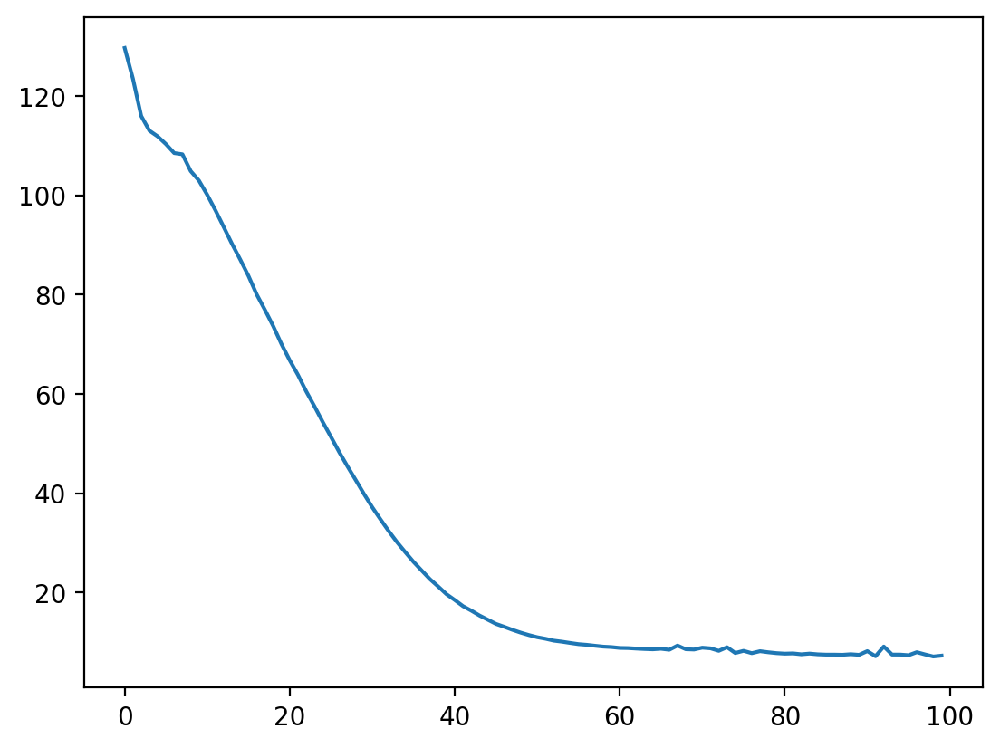

In [13]:
print(f"Loss at epoch 1: {history.history['loss'][0]}")
print(f"Loss at epoch 100: {history.history['loss'][99]}")
plt.plot(history.history['loss'])

# Generating Music

In [14]:
def music_inference_model(LSTM_cell, densor, Ty=100):
    """
    Uses the trained "LSTM_cell" and "densor" from model() to generate a sequence of values.
    
    Arguments:
    LSTM_cell -- the trained "LSTM_cell" from model(), Keras layer object
    densor -- the trained "densor" from model(), Keras layer object
    Ty -- integer, number of time steps to generate
    
    Returns:
    inference_model -- Keras model instance
    """

    n_values = densor.units
    n_a = LSTM_cell.units

    x0 = Input(shape=(1, n_values))
    a0 = Input(shape=(n_a,), name='a0')
    c0 = Input(shape=(n_a,), name='c0')
    a = a0
    c = c0
    x = x0

    outputs = []

    for t in range(Ty):

        a, _, c = LSTM_cell(x, initial_state=[a, c])

        out = densor(a)
        outputs.append(out)

        x = keras.ops.argmax(out, axis=-1)
        x = keras.ops.one_hot(x, n_values)

        x = RepeatVector(1)(x)

    inference_model = Model(inputs=[x0, a0, c0], outputs=outputs)

    return inference_model

In [15]:
inference_model = music_inference_model(LSTM_cell, densor, Ty=50)

In [16]:
inference_model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 1, 90)     │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ a0 (InputLayer)     │ (None, 64)        │          0 │ -                 │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ c0 (InputLayer)     │ (None, 64)        │          0 │ -                 │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm (LSTM)         │ [(None, 64),      │     39,680 │ input_layer_1[0]… │
│                     │ (None, 64),       │            │ a0[0][0],         │
│                     │ (None, 64)]       │            │ c0[0][0],         │
│                     │                   │            │ repeat_vector[0]… │
│                     │                   │            │ lstm[30][0],      │
│                     │                   │            │ lstm[30][2],      │
│                     │                   │            │ repeat_vector_1[… │
│                     │                   │            │ lstm[31][0],      │
│                     │                   │            │ lstm[31][2],      │
│                     │                   │            │ repeat_vector_2[… │
│                     │                   │            │ lstm[32][0],      │
│                     │                   │            │ lstm[32][2],      │
│                     │                   │            │ repeat_vector_3[… │
│                     │                   │            │ lstm[33][0],      │
│                     │                   │            │ lstm[33][2],      │
│                     │                   │            │ repeat_vector_4[… │
│                     │                   │            │ lstm[34][0],      │
│                     │                   │            │ lstm[34][2],      │
│                     │                   │            │ repeat_vector_5[… │
│                     │                   │            │ lstm[35][0],      │
│                     │                   │            │ lstm[35][2],      │
│                     │                   │            │ repeat_vector_6[… │
│                     │                   │            │ lstm[36][0],      │
│                     │                   │            │ lstm[36][2],      │
│                     │                   │            │ repeat_vector_7[… │
│                     │                   │            │ lstm[37][0],      │
│                     │                   │            │ lstm[37][2],      │
│                     │                   │            │ repeat_vector_8[… │
│                     │                   │            │ lstm[38][0],      │
│                     │                   │            │ lstm[38][2],      │
│                     │                   │            │ repeat_vector_9[… │
│                     │                   │            │ lstm[39][0],      │
│                     │                   │            │ lstm[39][2],      │
│                     │                   │            │ repeat_vector_10… │
│                     │                   │            │ lstm[40][0],      │
│                     │                   │            │ lstm[40][2],      │
│                     │                   │            │ repeat_vector_11… │
│                     │                   │            │ lstm[41][0],      │
│                     │                   │            │ lstm[41][2],      │
│                     │                   │            │ repeat_vector_12… │
│                     │                   │            │ lstm[42][0],      │
│                     │                   │            │ lstm[42][2],    

 Total params: 45,530 (177.85 KB)

 Trainable params: 45,530 (177.85 KB)

 Non-trainable params: 0 (0.00 B)

In [17]:
x_initializer = np.zeros((1, 1, n_values))
a_initializer = np.zeros((1, n_a))
c_initializer = np.zeros((1, n_a))

In [18]:
def predict_and_sample(inference_model, x_initializer = x_initializer, a_initializer = a_initializer, 
                       c_initializer = c_initializer):
    """
    Predicts the next value of values using the inference model.
    
    Arguments:
    inference_model -- Keras model instance for inference time
    x_initializer -- numpy array of shape (1, 1, 90), one-hot vector initializing the values generation
    a_initializer -- numpy array of shape (1, n_a), initializing the hidden state of the LSTM_cell
    c_initializer -- numpy array of shape (1, n_a), initializing the cell state of the LSTM_cel
    
    Returns:
    results -- numpy-array of shape (Ty, 90), matrix of one-hot vectors representing the values generated
    indices -- numpy-array of shape (Ty, 1), matrix of indices representing the values generated
    """

    n_values = x_initializer.shape[2]

    pred = inference_model.predict([x_initializer, a_initializer, c_initializer])

    indices = np.argmax(pred, axis=-1)
    results = to_categorical(indices, num_classes=n_values)

    return results, indices

In [19]:
results, indices = predict_and_sample(inference_model, x_initializer, a_initializer, c_initializer)

print("np.argmax(results[12]) =", np.argmax(results[12]))
print("np.argmax(results[17]) =", np.argmax(results[17]))
print("list(indices[12:18]) =", list(indices[12:18]))

1/1 ━━━━━━━━━━━━━━━━━━━━ 16s 16s/step
np.argmax(results[12]) = 17
np.argmax(results[17]) = 17
list(indices[12:18]) = [array([17]), array([4]), array([14]), array([84]), array([14]), array([17])]


In [20]:
out_stream = generate_music(inference_model, indices_values, chords)

Predicting new values for different set of chords.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step
Generated 36 sounds using the predicted values for the set of chords ("1") and after pruning
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step
Generated 36 sounds using the predicted values for the set of chords ("2") and after pruning
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step
Generated 36 sounds using the predicted values for the set of chords ("3") and after pruning
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step
Generated 35 sounds using the predicted values for the set of chords ("4") and after pruning
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step
Generated 36 sounds using the predicted values for the set of chords ("5") and after pruning
Your generated music is saved in output/my_music.midi


In [21]:
mid2wav('output/my_music.midi')
IPython.display.Audio("./output/rendered.wav")

In [22]:
IPython.display.Audio('./data/30s_trained_model.wav')